<a href="https://colab.research.google.com/github/AIWintermuteAI/Seeed_Python_MachineLearning/blob/main/jupyter_notebooks/aXeleRate_lung_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Segmentation model Training and Inference

In this notebook we will use axelerate Keras-based framework for AI on the edge to quickly setup model training and then after training session is completed convert it to .tflite format for optimized inference with Raspberry Pi 4 CM inside of reTerminal. Of course, the model will work just as well with original Raspberry Pi or other supported hardware.

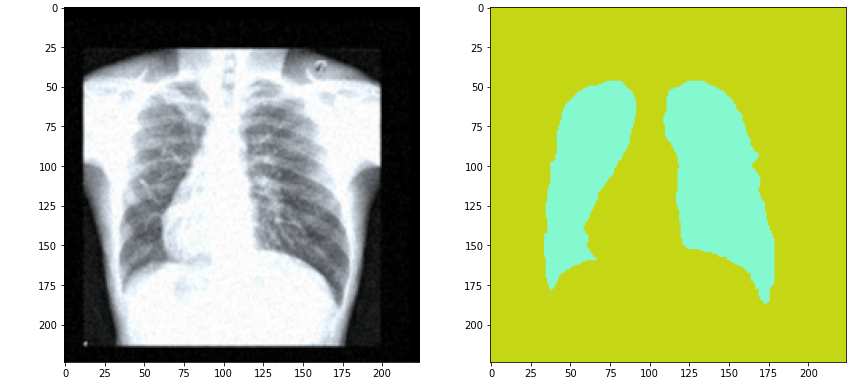

First, let's take care of some administrative details. 

1) Before we do anything, make sure you have choosen GPU as Runtime type (in Runtime - > Change Runtime type).

2) We need to mount Google Drive for saving our model checkpoints and final converted model(s). Press on Mount Google Drive button in Files tab on your left. 

In the next cell we clone axelerate Github repository and import it. 

**It is possible to use pip install or python setup.py install, but in that case you will need to restart the enironment.** Since I'm trying to make the process as streamlined as possibile I'm using sys.path.append for import.

In [1]:
#we need imgaug 0.4 for image augmentations to work properly, see https://stackoverflow.com/questions/62580797/in-colab-doing-image-data-augmentation-with-imgaug-is-not-working-as-intended
!pip uninstall -y imgaug && pip uninstall -y albumentations && pip install imgaug==0.4
!git clone https://github.com/AIWintermuteAI/aXeleRate.git
import sys
sys.path.append('/content/aXeleRate')
from axelerate import setup_training, setup_inference

Found existing installation: imgaug 0.2.9
Uninstalling imgaug-0.2.9:
  Successfully uninstalled imgaug-0.2.9
Found existing installation: albumentations 0.1.12
Uninstalling albumentations-0.1.12:
  Successfully uninstalled albumentations-0.1.12
     |████████████████████████████████| 948 kB 7.7 MB/s 
Cloning into 'aXeleRate'...
remote: Enumerating objects: 2282, done.
remote: Counting objects: 100% (335/335), done.
remote: Compressing objects: 100% (222/222), done.
remote: Total 2282 (delta 212), reused 211 (delta 111), pack-reused 1947
Receiving objects: 100% (2282/2282), 9.66 MiB | 27.87 MiB/s, done.
Resolving deltas: 100% (1462/1462), done.


At this step you typically need to get the dataset. You can use !wget command to download it from somewhere on the Internet or !cp to copy from My Drive as in this example
```
!cp -r /content/drive/'My Drive'/pascal_20_segmentation.zip .
!unzip --qq pascal_20_segmentation.zip
```
For this notebook we'll download the dataset I shared on Google Drive - it is digital image database for Tuberculosis, created by the National Library of Medicine, Maryland, USA in collaboration with Shenzhen No.3 People’s Hospital, Guangdong Medical College, Shenzhen, China. It contains:
- 336 cases with manifestation of tuberculosis, and 
- 326 normal cases.

The processed version of dataset I repackaged contains 688 training images and segmentation masks and 16 validation images and segmentation masks. The images and masks are resized to 512x512 pixels.

For semantic segmentation the dataset consists of RGB images and segmentation masks. 
A few things to keep in mind:

- The filenames of the annotation images should be same as the filenames of the RGB images.

- The dimensions of the annotation image for the corresponding RGB image should be same.

- For each pixel in the RGB image, the class label of that pixel in the annotation image would be the value of the annotation image pixel.

Let's visualize our semantic segmentation test dataset and see what that means in practice.


Downloading...
From: https://drive.google.com/uc?id=1yefDl16blIpHMln5_ylgfk1-k1hhx0hr
To: /content/lung_segmentation.zip
218MB [00:01, 177MB/s]
Please press any key to display the next image
Found the following classes in the segmentation image: [0 1]


/usr/local/lib/python3.7/dist-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `ContrastNormalization()` is deprecated. Use `imgaug.contrast.LinearContrast` instead.
  warn_deprecated(msg, stacklevel=3)


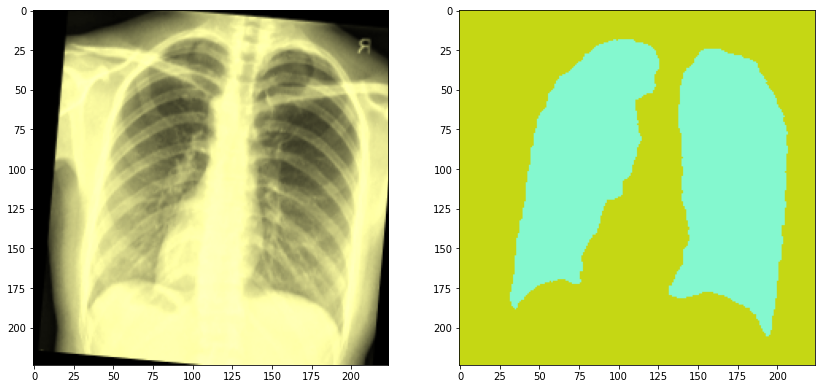

Found the following classes in the segmentation image: [0 1]


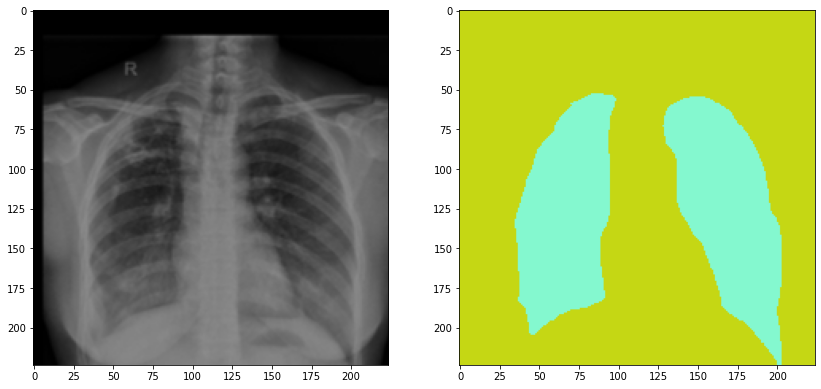

Found the following classes in the segmentation image: [0 1]


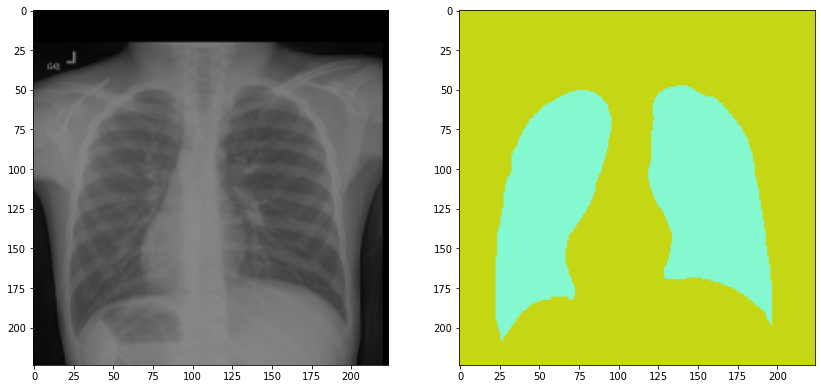

Found the following classes in the segmentation image: [0 1]


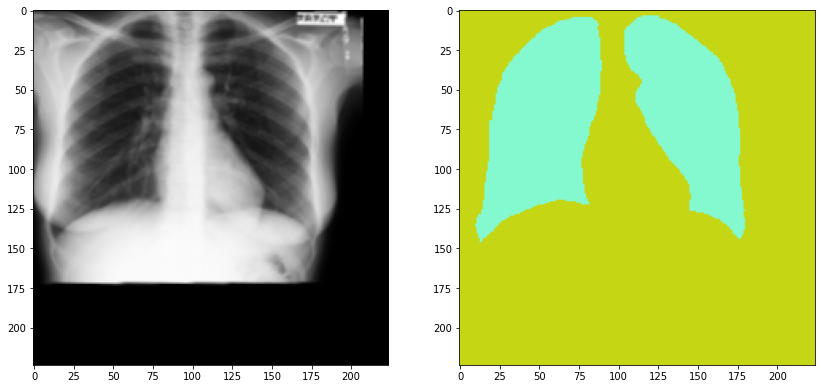

Found the following classes in the segmentation image: [0 1]


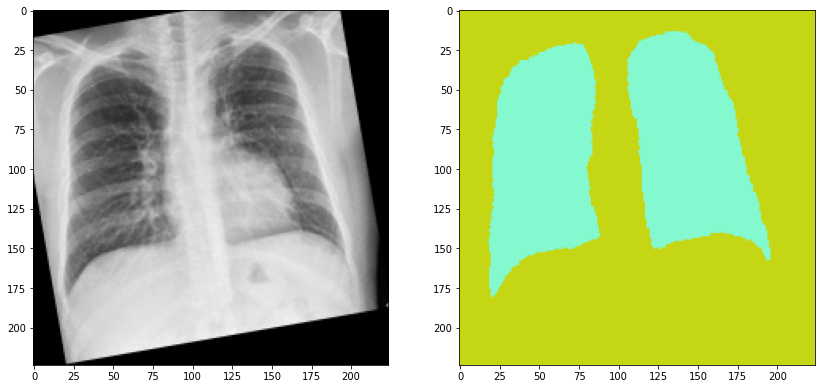

Found the following classes in the segmentation image: [0 1]


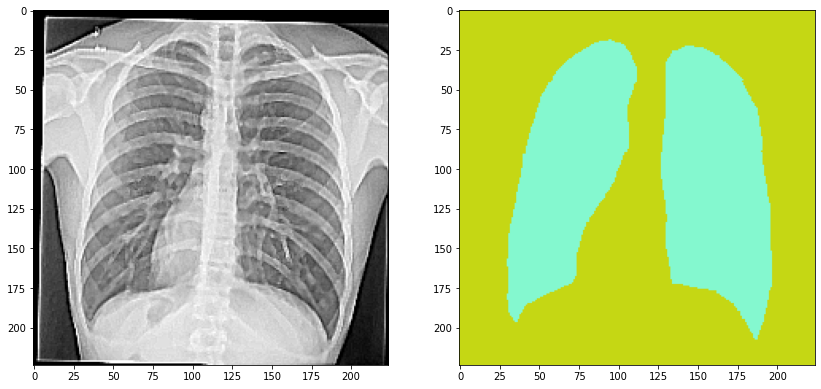

Found the following classes in the segmentation image: [0 1]


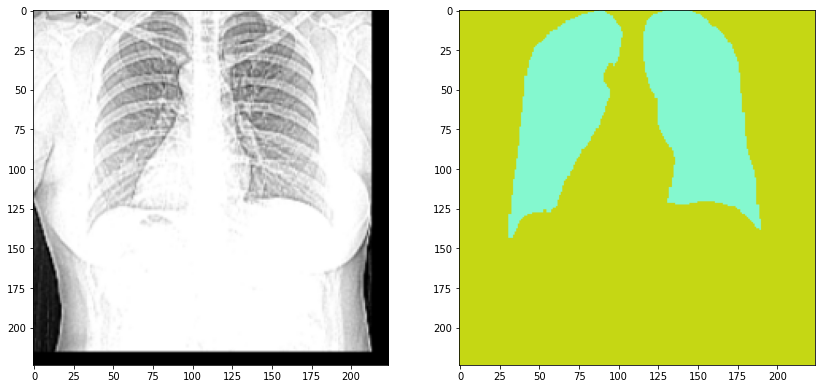

Found the following classes in the segmentation image: [0 1]


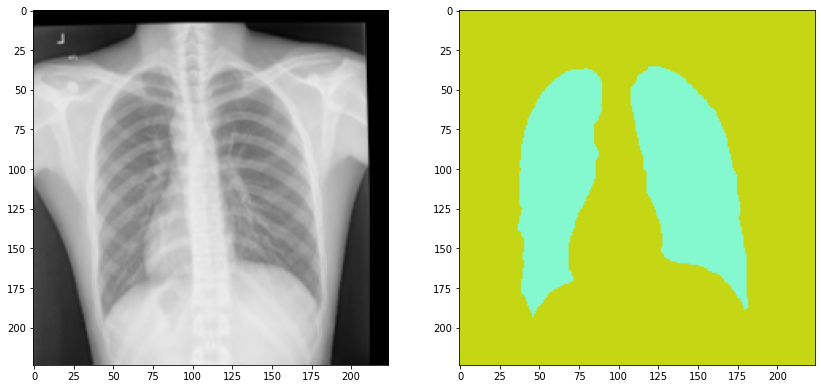

Found the following classes in the segmentation image: [0 1]


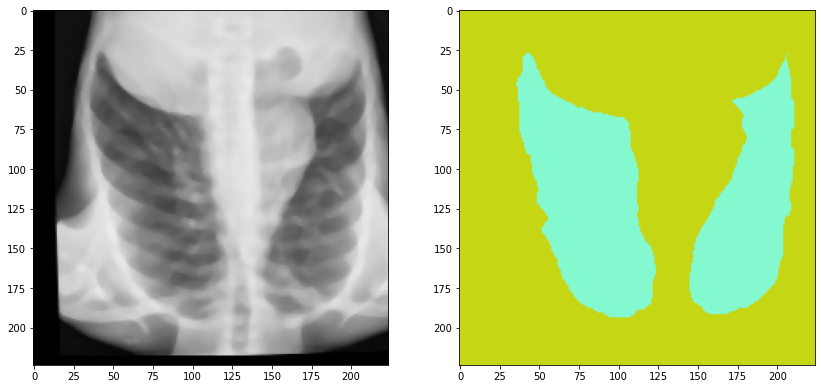

Found the following classes in the segmentation image: [0 1]


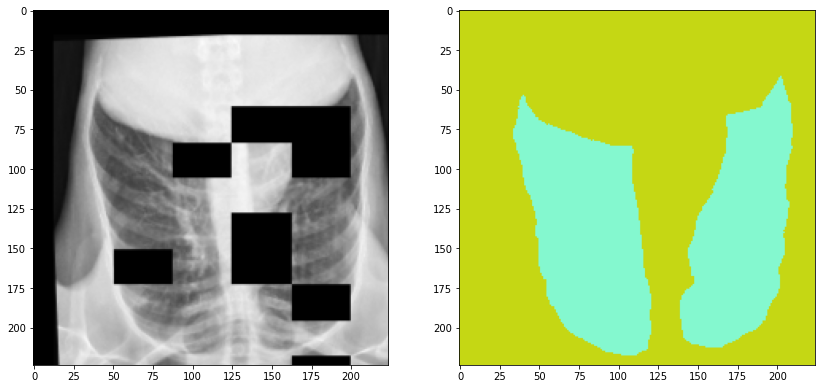

In [2]:
%matplotlib inline
!gdown https://drive.google.com/uc?id=1yefDl16blIpHMln5_ylgfk1-k1hhx0hr
!unzip --qq -d lung_segmentation lung_segmentation.zip

from axelerate.networks.common_utils.augment import visualize_segmentation_dataset

visualize_segmentation_dataset(images_path = 'lung_segmentation/imgs_validation', segs_path = 'lung_segmentation/anns_validation', num_imgs = 10, img_size=224, augment=True, n_classes=2)

Next step is defining a config dictionary. Most lines are self-explanatory.

Type is model frontend - Classifier, Detector or Segnet

Architecture is model backend (feature extractor) 

- Full Yolo
- Tiny Yolo
- MobileNet1_0
- MobileNet7_5 
- MobileNet5_0 
- MobileNet2_5 
- SqueezeNet
- NASNetMobile
- ResNet50
- DenseNet121

For converter type you can choose the following:

'k210', 'tflite_fullint', 'tflite_dynamic', 'edgetpu', 'openvino', 'onnx'

In [3]:
config = {
            "model" : {
                "type":                 "SegNet",
                "architecture":         "MobileNet5_0",
                "input_size":           224,
                "n_classes" : 		      2
            },
            "weights" : {
            "full":   				"",
            "backend":   		    "imagenet"
        },
            "train" : {
                "actual_epoch":         30,
                "train_image_folder":   "lung_segmentation/imgs",
                "train_annot_folder":   "lung_segmentation/anns",
                "train_times":          1,
                "valid_image_folder":   "lung_segmentation/imgs_validation",
                "valid_annot_folder":   "lung_segmentation/anns_validation",
                "valid_times":          1,
                "valid_metric":         "val_loss",
                "batch_size":           16,
                "learning_rate":        1e-3,
                "saved_folder":   		F"/content/drive/MyDrive/projects/lung_segmentation",
                "first_trainable_layer": "",
                "ignore_zero_class":    False,
                "augumentation":				True
            },
            "converter" : {
                "type":   				[]
            }
        }

Let's check what GPU we have been assigned in this Colab session, if any.

In [4]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 16687458699483363589, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 16183459840
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 9871373002709473511
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"]

Also, let's open Tensorboard, where we will be able to watch model training progress in real time. Training and validation logs also will be saved in project folder.
Since there are no logs before we start the training, tensorboard will be empty. Refresh it after first epoch.

In [5]:
%load_ext tensorboard
%tensorboard --logdir logs
!sleep 10

<IPython.core.display.Javascript object>

Finally we start the training by passing config dictionary we have defined earlier to setup_training function. The function will start the training with Checkpoint, Cosine Annealing LR Schedule with Warm-up and Early Stopping callbacks. If you have specified the converter type in the config, after the training has stopped the script will convert the best model into the format you have specified in config and save it to the project folder.

In [6]:
from keras import backend as K 
K.clear_session()
model_path = setup_training(config_dict=config)

Project folder /content/drive/MyDrive/projects/lung_segmentation is created.
Segmentation
5578752/5577668 [==============================] - 0s 0us/step
Successfully loaded imagenet backend weights
Failed to load pre-trained weights for the whole model. It might be because you didn't specify any or the weight file cannot be found
Current training session folder is /content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12


Model: "segnet"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 226, 226, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 16)      432       
_________________________________________________________________
conv1_bn (BatchNo

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.7/dist-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `ContrastNormalization()` is deprecated. Use `imgaug.contrast.LinearContrast` instead.
  warn_deprecated(msg, stacklevel=3)


Epoch 1/30
43/43 [==============================] - 38s 411ms/step - loss: 0.3855 - val_loss: 1.5841

Epoch 00001: val_loss improved from inf to 1.58408, saving model to /content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Segnet_best_val_loss.h5
Epoch 00000: Learning rate is 0.0003255813953488372.

Epoch 2/30
43/43 [==============================] - 21s 454ms/step - loss: 0.1261 - val_loss: 1.2160

Epoch 00002: val_loss improved from 1.58408 to 1.21598, saving model to /content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Segnet_best_val_loss.h5
Epoch 00001: Learning rate is 0.0006589147286821705.

Epoch 3/30
43/43 [==============================] - 18s 386ms/step - loss: 0.0997 - val_loss: 0.5563

Epoch 00003: val_loss improved from 1.21598 to 0.55626, saving model to /content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Segnet_best_val_loss.h5
Epoch 00002: Learning rate is 0.0009922480620155039.

Epoch 4/30
43/43 [====================

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


After training it is good to check the actual perfomance of your model by doing inference on your validation dataset and visualizing results. This is exactly what next block does. Our model used pre-trained weights and since we set learning rate to 0, we are just observing the perfomance of the model that was trained before.

Folder /content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results is created.
Segmentation
Loading pre-trained weights for the whole model:  /content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Segnet_best_val_loss.h5
Found the following classes in the segmentation image: [0 1]


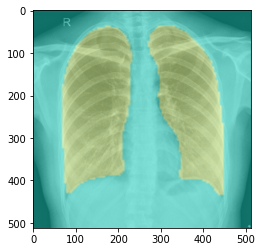

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0291_0.png
Found the following classes in the segmentation image: [0 1]


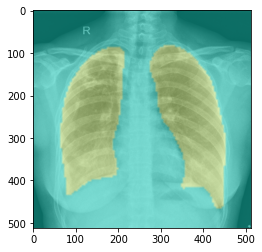

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0575_1.png
Found the following classes in the segmentation image: [0 1]


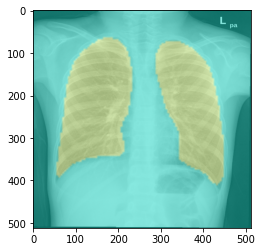

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0273_0.png
Found the following classes in the segmentation image: [0 1]


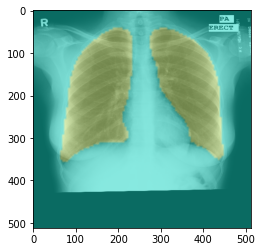

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/MCUCXR_0087_0.png
Found the following classes in the segmentation image: [0 1]


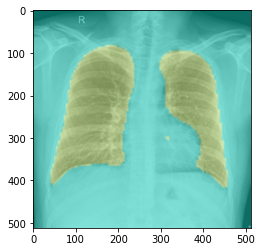

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0340_1.png
Found the following classes in the segmentation image: [0 1]


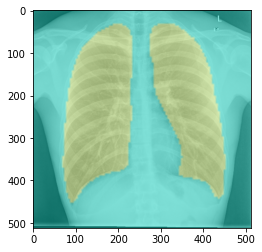

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0168_0.png
Found the following classes in the segmentation image: [0 1]


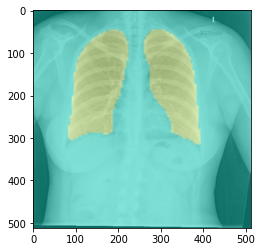

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0077_0.png
Found the following classes in the segmentation image: [0 1]


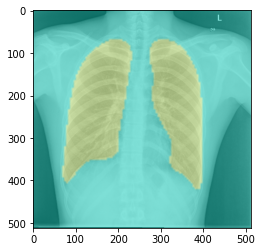

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0101_0.png
Found the following classes in the segmentation image: [0 1]


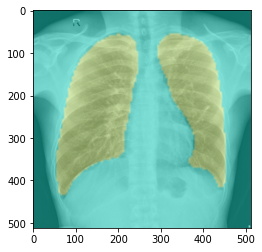

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0645_1.png
Found the following classes in the segmentation image: [0 1]


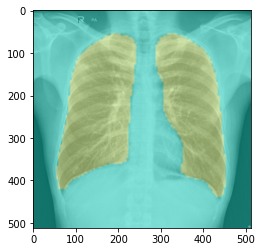

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0537_1.png
Found the following classes in the segmentation image: [0 1]


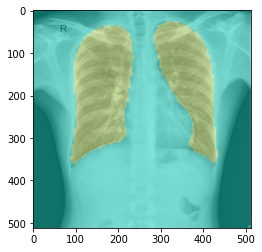

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0465_1.png
Found the following classes in the segmentation image: [0 1]


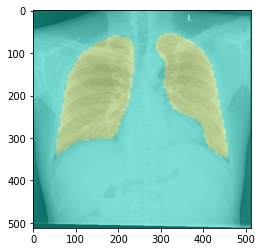

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0117_0.png
Found the following classes in the segmentation image: [0 1]


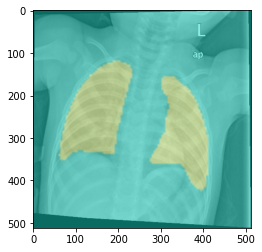

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0178_0.png
Found the following classes in the segmentation image: [0 1]


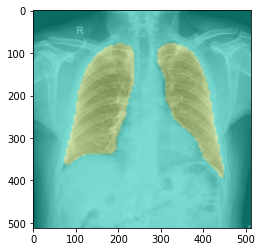

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0652_1.png
Found the following classes in the segmentation image: [0 1]


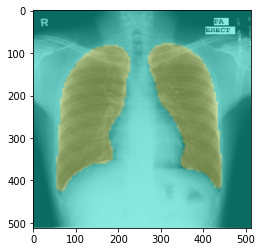

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/MCUCXR_0091_0.png
Found the following classes in the segmentation image: [0 1]


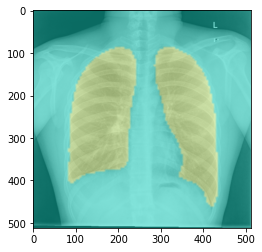

/content/drive/MyDrive/projects/lung_segmentation/2021-08-12_07-34-12/Inference_results/CHNCXR_0504_1.png


In [7]:
%matplotlib inline
from keras import backend as K 
K.clear_session()
setup_inference(config, model_path)

If you need to convert trained model to other formats, for example for inference with Edge TPU or Kendryte K210, you can do it with following commands. In this case we'd like to optimize the model for inference on Raspberry Pi 4, so we choose tflite_fullint, which will create an INT8 quantized model with FLOAT32 inputs and outputs (so we don't need to apply scaling in the inference code). Specify the converter type, backend and folder with calbiration images(normally your validation image folder, but in this case since we only have 16 validation images, we'll calibrate on images used for training - only 300 images will be used).

In [8]:
from axelerate.networks.common_utils.convert import Converter
converter = Converter('tflite_fullint', 'MobileNet5_0', 'lung_segmentation/imgs')
converter.convert_model(model_path)

Tflite Converter ready


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


Good luck and happy training! Have a look at these articles, that would allow you to get the most of Google Colab or connect to local runtime if there are no GPUs available;

https://medium.com/@oribarel/getting-the-most-out-of-your-google-colab-2b0585f82403

https://research.google.com/colaboratory/local-runtimes.html